# Introduction to Generative Modeling

Deep neural networks are used mainly for supervised learning: classification or regression. Generative Adversarial Networks or GANs, however, use neural networks for a very different purpose: Generative modeling

> Generative modeling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset. - [Source](https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/)

To get a sense of the power of generative models, just visit [thispersondoesnotexist.com](https://thispersondoesnotexist.com). Every time you reload the page, a new image of a person's face is generated on the fly. The results are pretty fascinating:

<img src="https://imgix.bustle.com/inverse/4b/17/8f/0e/cf91/4506/99c7/e6a491c5d4ac/these-people-are-not-real--they-were-produced-by-our-generator-that-allows-control-over-different-a.png" style="width:480px; margin-bottom:32px"/>

While there are many approaches used for generative modeling, a Generative Adversarial Network takes the following approach:

<img src="https://i.imgur.com/6NMdO9u.png" style="width:420px; margin-bottom:32px"/>

There are two neural networks: a *Generator* and a *Discriminator*. The generator generates a "fake" sample given a random vector/matrix, and the discriminator attempts to detect whether a given sample is "real" (picked from the training data) or "fake" (generated by the generator). Training happens in tandem: we train the discriminator for a few epochs, then train the generator for a few epochs, and repeat. This way both the generator and the discriminator get better at doing their jobs.

GANs however, can be notoriously difficult to train, and are extremely sensitive to hyperparameters, activation functions and regularization. In this tutorial, we'll train a GAN to generate images of anime characters' faces.

<img src="https://i.imgur.com/NaKtJs0.png" width="360" style="margin-bottom:32px"/>


We'll use the [Anime Face Dataset](https://github.com/Mckinsey666/Anime-Face-Dataset), which consists of over 63,000 cropped anime faces. Note that generative modeling is an unsupervised learning task, so the images do not have any labels. Most of the code in this tutorial is based [on this notebook](https://www.kaggle.com/splcher/starter-anime-face-dataset).

## Downloading and Exploring the Data

We can use the [`opendatasets`](https://github.com/JovianML/opendatasets) library to download the [dataset](https://www.kaggle.com/splcher/animefacedataset) from Kaggle. `opendatasets` uses the [Kaggle Official API](https://github.com/Kaggle/kaggle-api) for downloading datasets from Kaggle.  Follow these steps to find your API credentials:

1. Sign in to  [https://kaggle.com/](https://kaggle.com),  then click on your profile picture on the top right and select "My Account" from the menu.

2. Scroll down to the "API" section and click "Create New API Token". This will download a file `kaggle.json` with the following contents:

```
{"username":"YOUR_KAGGLE_USERNAME","key":"YOUR_KAGGLE_KEY"}
```

3. When you run `opendatsets.download`, you will be asked to enter your username & Kaggle API, which you can get from the file downloaded in step 2.

Note that you need to download the `kaggle.json` file only once. On Google Colab, you can also upload the `kaggle.json` file using the files tab, and the credentials will be read automatically.

In [1]:
pip install opendatasets

In [2]:
import opendatasets as od

In [3]:
dataset_url = 'https://www.kaggle.com/splcher/animefacedataset'
od.download(dataset_url)

Skipping, found downloaded files in "./animefacedataset" (use force=True to force download)


In [4]:
import os
DATA_DIR = './animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [5]:
print(os.listdir(DATA_DIR+'/images')[:10])

['1610_2001.jpg', '42995_2013.jpg', '50098_2015.jpg', '63126_2019.jpg', '50994_2015.jpg', '24834_2009.jpg', '58289_2017.jpg', '46600_2014.jpg', '42942_2013.jpg', '18436_2007.jpg']


In [6]:
import torch
import matplotlib.pyplot as plt
%matplotlib inline

Let's load this dataset using the `ImageFolder` class from `torchvision`. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range `(-1, 1)`, which is more  convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [7]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [8]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [9]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([ # as we have here one folder 'image', so the label of all the image will be 0
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)])) # now, all images got transfor

In [10]:
type(train_ds[60000])

tuple

In [11]:
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)

In [12]:
for image, label in train_dl:
    break
# As here we have only one class i.e. anime, so in label we will have only 0

In [13]:
len(image), len(label)

(128, 128)

In [14]:
image[110]

tensor([[[ 1.0000,  1.0000,  0.4039,  ...,  0.1294, -0.1373,  0.1608],
         [ 1.0000,  0.7176, -0.1529,  ...,  0.0902,  0.0588, -0.2549],
         [ 1.0000,  0.0980,  0.0118,  ...,  0.2471,  0.3412,  0.0353],
         ...,
         [ 1.0000,  0.9922,  1.0000,  ...,  0.2078,  0.1608, -0.3569],
         [ 0.9922,  0.9922,  1.0000,  ...,  0.1451,  0.2314, -0.0588],
         [ 1.0000,  0.9922,  1.0000,  ...,  0.1137,  0.2314,  0.1686]],

        [[ 0.9843,  0.9843,  0.2549,  ..., -0.2000, -0.4667, -0.1765],
         [ 0.9843,  0.6314, -0.3412,  ..., -0.2392, -0.2863, -0.5922],
         [ 0.9686, -0.0431, -0.2392,  ..., -0.1059, -0.0196, -0.3176],
         ...,
         [ 1.0000,  0.9922,  0.9843,  ...,  0.1608,  0.1137, -0.4196],
         [ 0.9922,  0.9922,  0.9843,  ...,  0.1216,  0.2000, -0.0902],
         [ 1.0000,  0.9922,  0.9843,  ...,  0.0902,  0.2157,  0.1608]],

        [[ 0.9608,  0.9451,  0.1843,  ..., -0.3098, -0.5765, -0.3020],
         [ 0.9608,  0.6000, -0.3961,  ..., -0

Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.

In [15]:
from torchvision.utils import make_grid

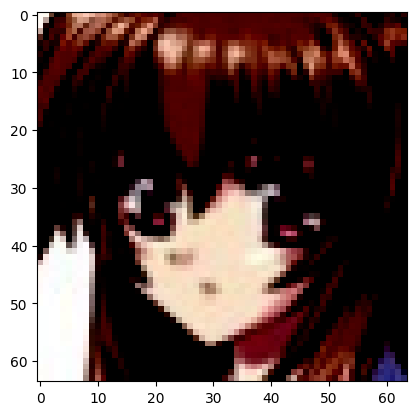

In [16]:
plt.imshow(image[110].permute(1, 2, 0))
# .permute is used to put the channel dimension at the last, so easily matplot can plot the 3 channels images

In [17]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [18]:
denorm(image[110])

tensor([[[1.0000, 1.0000, 0.7020,  ..., 0.5647, 0.4314, 0.5804],
         [1.0000, 0.8588, 0.4235,  ..., 0.5451, 0.5294, 0.3725],
         [1.0000, 0.5490, 0.5059,  ..., 0.6235, 0.6706, 0.5176],
         ...,
         [1.0000, 0.9961, 1.0000,  ..., 0.6039, 0.5804, 0.3216],
         [0.9961, 0.9961, 1.0000,  ..., 0.5725, 0.6157, 0.4706],
         [1.0000, 0.9961, 1.0000,  ..., 0.5569, 0.6157, 0.5843]],

        [[0.9922, 0.9922, 0.6275,  ..., 0.4000, 0.2667, 0.4118],
         [0.9922, 0.8157, 0.3294,  ..., 0.3804, 0.3569, 0.2039],
         [0.9843, 0.4784, 0.3804,  ..., 0.4471, 0.4902, 0.3412],
         ...,
         [1.0000, 0.9961, 0.9922,  ..., 0.5804, 0.5569, 0.2902],
         [0.9961, 0.9961, 0.9922,  ..., 0.5608, 0.6000, 0.4549],
         [1.0000, 0.9961, 0.9922,  ..., 0.5451, 0.6078, 0.5804]],

        [[0.9804, 0.9725, 0.5922,  ..., 0.3451, 0.2118, 0.3490],
         [0.9804, 0.8000, 0.3020,  ..., 0.3255, 0.3059, 0.1412],
         [0.9765, 0.4627, 0.3529,  ..., 0.3961, 0.4392, 0.

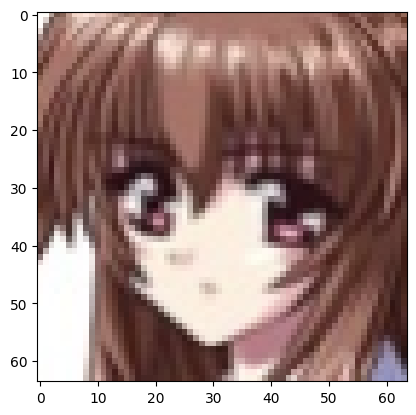

In [19]:
plt.imshow(denorm(image[110]).permute(1,2,0))
# this is the actual image before normalization

In [20]:
def show_images(images, nmax=128):
    fig, ax = plt.subplots(figsize=(8, 16))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch_Using_DataLoader(dl, nmax=128):
    for images, _ in dl: # selecting a random batch here
        show_images(images, nmax)
        break

def show_batch_Using_Batch(image, nmax=128):
    show_images(image, nmax)

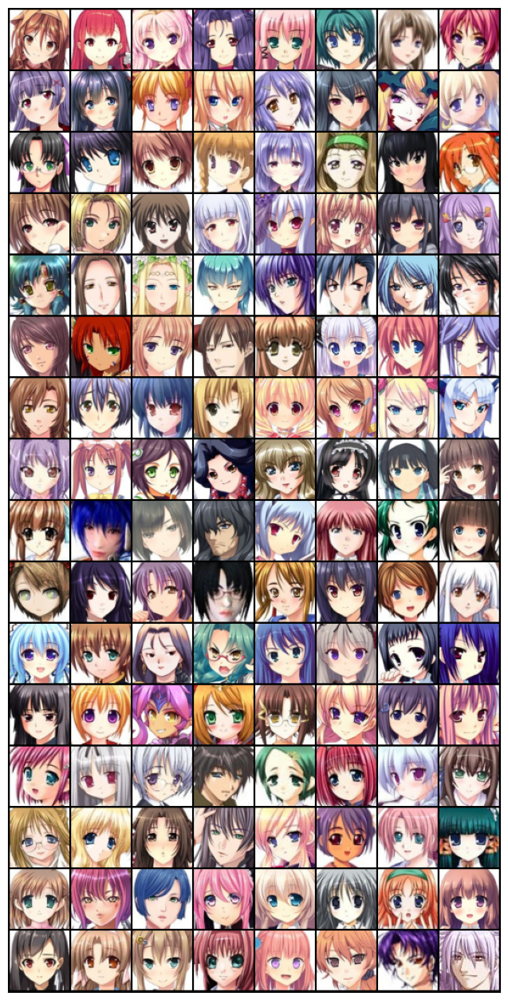

In [21]:
show_batch_Using_DataLoader(train_dl) # this is showing all the images of a batch

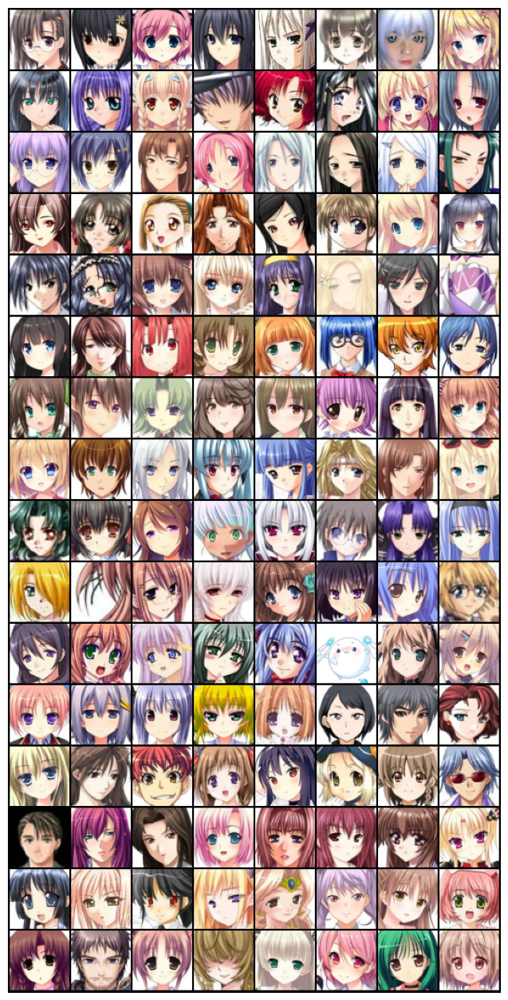

In [22]:
show_batch_Using_Batch(image)

## Using a GPU

To seamlessly use a GPU, if one is available, we define a couple of helper functions (`get_default_device` & `to_device`) and a helper class `DeviceDataLoader` to move our model & data to the GPU, if one is available.

In [23]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Based on where you're running this notebook, your default device could be a CPU (`torch.device('cpu')`) or a GPU (`torch.device('cuda')`).

In [24]:
device = get_default_device()
device

device(type='cuda')

We can now move our training data loader using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available).

In [25]:
train_dl = DeviceDataLoader(train_dl, device)

## Discriminator Network

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

![](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd.gif)

In [26]:
import torch.nn as nn

The first model we will define is a discriminator.</br>
The `discriminator` takes an image as an input. And it trires to classify that image a real image or a generated image. </br>
Ib this sense its like anyother neural network trained so far. We will use a CNN which will output a single number for each image. then this number is need to interpret as the probability the discriminator thinks that this imag ewas drawn from the actual dataset.</br>
If the discriminator output is `zero` then it is predicting that the image was generated from generator and is the discriminator output is `one` or close to one then the image was picked from actual dataset. This kind of classification is often call bianry classification. This is different from multi class classification.

In [27]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64 (for a image)

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True), # this is an activation function
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False), # here the kernel will fit exactly on each of the 512 channels
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

Note that we're using the Leaky ReLU activation for the discriminator.

<img src="https://cdn-images-1.medium.com/max/1600/1*ypsvQH7kvtI2BhzR2eT_Sw.png" width="420">


>  Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values. As a result, it makes the gradients from the discriminator flows stronger into the generator. Instead of passing a gradient (slope) of 0 in the back-prop pass, it passes a small negative gradient.  - [Source](https://sthalles.github.io/advanced_gans/)

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [28]:
discriminator = to_device(discriminator, device)

## Generator Network

The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape `(128, 1, 1)` into an image tensor of shape `3 x 28 x 28`. To achive this, we'll use the `ConvTranspose2d` layer from PyTorch, which is performs to as a *transposed convolution* (also referred to as a *deconvolution*). [Learn more](https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md#transposed-convolution-animations)

![](https://i.imgur.com/DRvK546.gif)

In [29]:
latent_size = 128
# we can try cahnging latent size to see if that gives you slightly different results
# The basic idea behind latent size is that if you had just one vector, then you would have just one dimension of control of the generator
# so u can think of the different latent vectors are controlling different aspects of the generated image
# may the first element of the  latent vector end with the controlling the hair of the color, may the second element of the latent vector end up with controlling th color of the eyes etc
# its not eactly this but its roughly this where some combination of the latent vaector controls the specific attribute of the generated image once the generator has been trained.
# means the more letent vector you have, the more variety you can get in your generated images.
# 128 or 64 is good for simpler images
# for more detailed images, there is need to use bigger size of latent.

In [30]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    # you can imagin here as 1*1(kernal) is moving on 4*4(image) -> just opposite
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh() # applying another activation funcion on output to put the pixels in range of -1 to 1
    # out: 3 x 64 x 64

    # If we recall, When we created our dataset, we applied a normalization which converts the real images
    # from having a 0 to 1 range of pixels value to having then in the range of -1 to 1.
    # so, now you see how its all fixed together, that images picked from the dataset after normalization ahve the pixel intensity in the range of -1 to 1 of the shape 3* 64 * 64.
    # And images generated from the generator, after applying hyperbolic tangent activation at the last layer wil also have the shape 3 * 64 * 64 and have pixel value range -1 to 1.
    # so, we have stup the generator in such a way that it is going to generate images which atleast have the same ranges of pixel intensity as the discriminator
    # the next step will be to train the generator, so not only ranges that match enev the pixels have such values which put all together its loop like the image often anime face
)

We use the TanH activation function for the output layer of the generator.

<img src="https://nic.schraudolph.org/teach/NNcourse/figs/tanh.gif" width="420" >

> "The ReLU activation (Nair & Hinton, 2010) is used in the generator with the exception of the output layer which uses the Tanh function. We observed that using a bounded activation allowed the model to learn more quickly to saturate and cover the color space of the training distribution. Within the discriminator we found the leaky rectified activation (Maas et al., 2013) (Xu et al., 2015) to work well, especially for higher resolution modeling." - [Source](https://stackoverflow.com/questions/41489907/generative-adversarial-networks-tanh)


Note that since the outputs of the TanH activation lie in the range `[-1,1]`, we have applied the similar transformation to the images in the training dataset. Let's generate some outputs using the generator and view them as images by transforming and denormalizing the output.

In [31]:
generator

Sequential(
  (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU(inplace=True)
  (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU(inplace=True)
  (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (13): Tanh()
)

The Generator Converts the each latent tensor into image of shape `3 * 64 * 64` and then to show the image we can use the same show images function what we had earlier, First we will denormalize the image. Then, we will take these fake image generated from genrator and see what kind of images generator generated. We will find that the generator Generator random noise. Now the generated need to get train to generate anime faces.

torch.Size([128, 3, 64, 64])


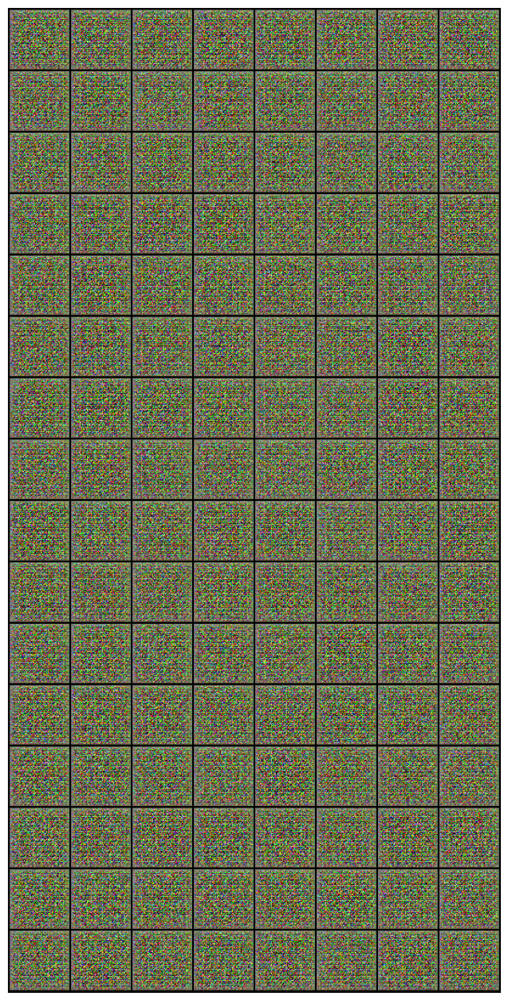

In [32]:
# input -> 128 * 128 * 1 * 1
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [33]:
generator = to_device(generator, device)

## Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

<img src="https://image.slidesharecdn.com/chrishokamp-dublinnlp3-160805110319/95/task-based-learning-for-nlp-going-beyond-cross-entropy-chris-hokamp-10-638.jpg?cb=1470395213" width="420" >

In [34]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    # what the actuallt the discriminator is need to predict is 1, mean that image is from our own dataset
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item() # we wont the real score of the discriminator as close to 1, to have a good detecting image between real and fake one

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Here are the steps involved in training the discriminator.

- We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network.

- We first pass a batch of real images, and compute the loss, setting the target labels to 1.

- Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

- Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (`opt_d` only affects the `discriminator.parameters()`)

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [35]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model as we have no validation set. We'll also create a helper function to export the generated images.

In [36]:
from torchvision.utils import save_image

In [37]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [44]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [45]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


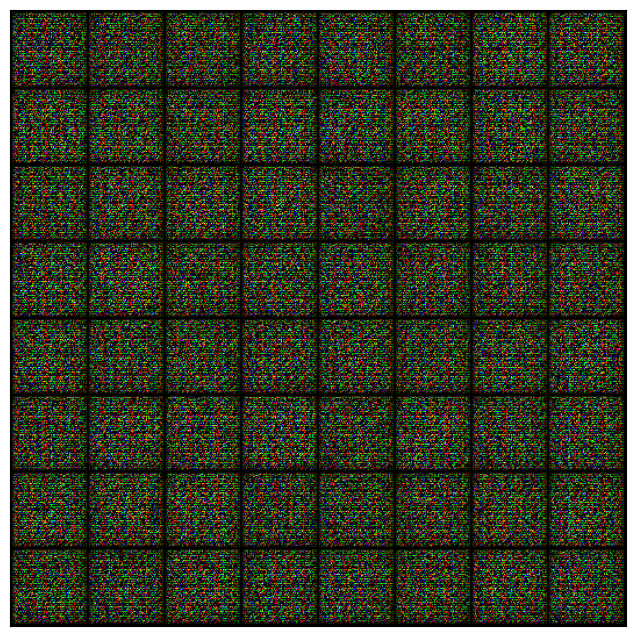

In [46]:
save_samples(0, fixed_latent)

## Full Training Loop

Let's define a `fit` function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>

In [47]:
from tqdm import tqdm
import torch.nn.functional as F

In [48]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [50]:
lr = 0.0002
epochs = 10

In [51]:
history = fit(epochs, lr)

100%|██████████| 497/497 [01:31<00:00,  5.43it/s]


Epoch [1/10], loss_g: 5.3690, loss_d: 0.6297, real_score: 0.8460, fake_score: 0.3370
Saving generated-images-0001.png


100%|██████████| 497/497 [01:31<00:00,  5.44it/s]


Epoch [2/10], loss_g: 5.2030, loss_d: 0.8340, real_score: 0.5411, fake_score: 0.0124
Saving generated-images-0002.png


100%|██████████| 497/497 [01:31<00:00,  5.42it/s]


Epoch [3/10], loss_g: 9.8330, loss_d: 0.8538, real_score: 0.9783, fake_score: 0.5038
Saving generated-images-0003.png


100%|██████████| 497/497 [01:31<00:00,  5.46it/s]


Epoch [4/10], loss_g: 2.9489, loss_d: 0.1573, real_score: 0.8910, fake_score: 0.0171
Saving generated-images-0004.png


100%|██████████| 497/497 [01:31<00:00,  5.43it/s]


Epoch [5/10], loss_g: 8.8151, loss_d: 0.4825, real_score: 0.7110, fake_score: 0.0003
Saving generated-images-0005.png


100%|██████████| 497/497 [01:30<00:00,  5.46it/s]


Epoch [6/10], loss_g: 9.1887, loss_d: 0.3263, real_score: 0.7974, fake_score: 0.0005
Saving generated-images-0006.png


100%|██████████| 497/497 [01:31<00:00,  5.45it/s]


Epoch [7/10], loss_g: 5.4127, loss_d: 0.0106, real_score: 0.9992, fake_score: 0.0095
Saving generated-images-0007.png


100%|██████████| 497/497 [01:31<00:00,  5.46it/s]


Epoch [8/10], loss_g: 7.0220, loss_d: 0.1821, real_score: 0.9395, fake_score: 0.0932
Saving generated-images-0008.png


100%|██████████| 497/497 [01:31<00:00,  5.44it/s]


Epoch [9/10], loss_g: 6.9154, loss_d: 0.1277, real_score: 0.9830, fake_score: 0.0982
Saving generated-images-0009.png


100%|██████████| 497/497 [01:30<00:00,  5.47it/s]

Epoch [10/10], loss_g: 3.5485, loss_d: 0.1583, real_score: 0.8987, fake_score: 0.0314
Saving generated-images-0010.png


In [52]:
history = fit(epochs, lr)

100%|██████████| 497/497 [01:31<00:00,  5.44it/s]


Epoch [1/10], loss_g: 7.5270, loss_d: 0.0429, real_score: 0.9647, fake_score: 0.0023
Saving generated-images-0001.png


100%|██████████| 497/497 [01:31<00:00,  5.44it/s]


Epoch [2/10], loss_g: 8.9181, loss_d: 0.4817, real_score: 0.7301, fake_score: 0.0000
Saving generated-images-0002.png


100%|██████████| 497/497 [01:31<00:00,  5.44it/s]


Epoch [3/10], loss_g: 7.3242, loss_d: 0.0534, real_score: 0.9779, fake_score: 0.0268
Saving generated-images-0003.png


100%|██████████| 497/497 [01:31<00:00,  5.41it/s]


Epoch [4/10], loss_g: 5.3905, loss_d: 0.3679, real_score: 0.7763, fake_score: 0.0008
Saving generated-images-0004.png


100%|██████████| 497/497 [01:31<00:00,  5.45it/s]


Epoch [5/10], loss_g: 7.1710, loss_d: 0.0922, real_score: 0.9299, fake_score: 0.0062
Saving generated-images-0005.png


100%|██████████| 497/497 [01:31<00:00,  5.45it/s]


Epoch [6/10], loss_g: 8.5767, loss_d: 0.0667, real_score: 0.9784, fake_score: 0.0387
Saving generated-images-0006.png


100%|██████████| 497/497 [01:30<00:00,  5.47it/s]


Epoch [7/10], loss_g: 5.6484, loss_d: 0.0670, real_score: 0.9689, fake_score: 0.0299
Saving generated-images-0007.png


100%|██████████| 497/497 [01:31<00:00,  5.42it/s]


Epoch [8/10], loss_g: 8.9044, loss_d: 0.2148, real_score: 0.8738, fake_score: 0.0008
Saving generated-images-0008.png


100%|██████████| 497/497 [01:31<00:00,  5.45it/s]


Epoch [9/10], loss_g: 7.0972, loss_d: 0.0980, real_score: 0.9671, fake_score: 0.0471
Saving generated-images-0009.png


100%|██████████| 497/497 [01:31<00:00,  5.45it/s]

Epoch [10/10], loss_g: 6.3167, loss_d: 0.0587, real_score: 1.0000, fake_score: 0.0507
Saving generated-images-0010.png


Now that we have trained the models, we can save checkpoints.

In [53]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

Here's how the generated images look, after the 1st, 5th and 10th epochs of training.

In [54]:
from IPython.display import Image

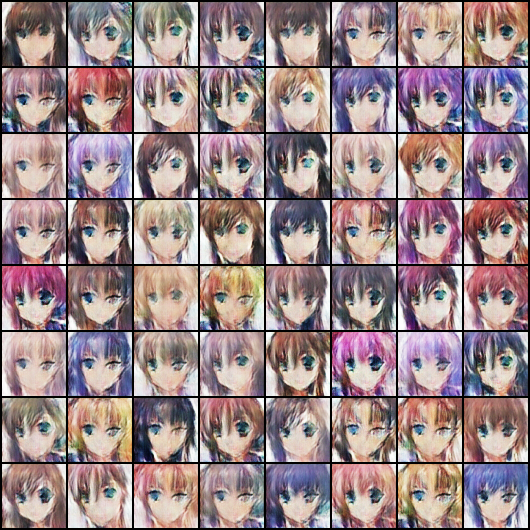

In [55]:
Image('./generated/generated-images-0001.png')

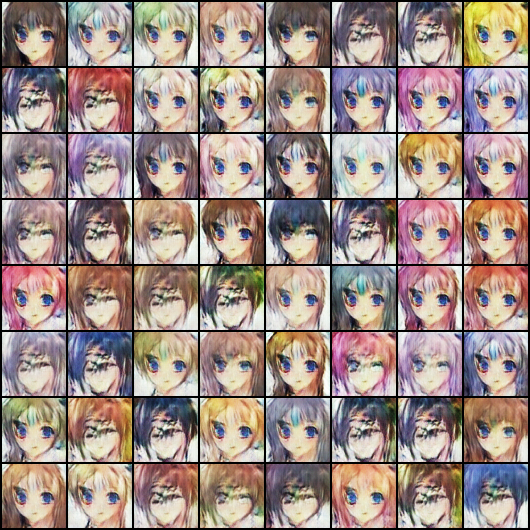

In [56]:
Image('./generated/generated-images-0010.png')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.

In [57]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

We can also visualize how the loss changes over time. Visualizing
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.


In [59]:
losses_g, losses_d, real_scores, fake_scores = history

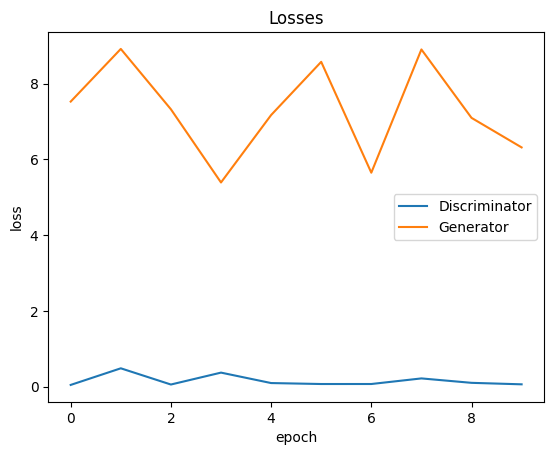

In [60]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

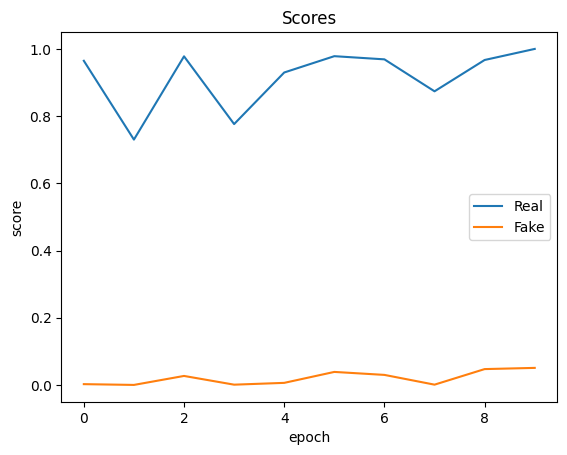

In [61]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');